### Spatio-Temporal Assessment of Nigeria's Drought Condition; Identifying drought ranges using Remote Sensing and VCI Drought index (VCI - Vegetation Condition Index is a computed numerical representation of drought severity assessed using agricultural input)

In [1]:
import ee
import geemap

#### Assessing Nigeria Normalized Difference Vegetation Index using the MODIS MOD13A2.061 Terra Vegetation Indices 16-Day Global 1km.....

In [2]:
# MODIS vegetation collection operates on a 16-day temporal resolution only but has several spatial resolutions, I chose 1km bcos am working on a large
# area, also I intend to merge the vegetation data with MODIS temperature data which only operate on 1km spatial resolution to calculate VHI 

'''
Here I am filtering for all images with a temporal resolution of 2023 and scaling the modis ndvi image by multiplying it by 0.0001 to view the resulting
image in classes from -1 to 1... the closer the value to 1 the richer or better the NDVI, I also clipping the image to Nigeria boundary (ng)
my study area
'''

m = geemap.Map()
ng = ee.FeatureCollection("FAO/GAUL/2015/level0").filter(ee.Filter.eq('ADM0_NAME', 'Nigeria'))
data = ee.ImageCollection("MODIS/061/MOD13A2").filterDate('2023-01-01', '2024-01-01').select('NDVI')
vegscale = data.map(lambda img: img.multiply(0.0001).copyProperties(img, ['system:time_start', 'system:time_end']))
ngveg = vegscale.map(lambda img: img.clipToCollection(ng))



ndviVis = {
  'min': 0.0,
  'max': 1,
  'palette': [
    'ffffff', 'ce7e45', 'df923d', 'f1b555', 'fcd163', '99b718', '74a901',
    '66a000', '529400', '3e8601', '207401', '056201', '004c00', '023b01',
    '012e01', '011d01', '011301'
  ],
}



vis_params = {
    'color': '#000000',
    'width': 1,
    'lineType': 'solid',
    'fillColor': '00000000',
}


m.addLayer(ngveg, ndviVis, 'NigeriaNDVI')
m.addLayer(ng.style(**vis_params), {}, 'Nigeria')
text = 'Map Created by Emeka Orji'
text2 = 'Data Source: MOD13A2.061 Terra Vegetation Indices'
m.add_text(text2, position='bottomleft', fontsize=12)
m.add_text(text)
m.add_colorbar(ndviVis, label='Nigeria NDVI', layer_name='NigeriaNDVI')
m.center_object(ng, zoom=6)
m

Map(center=[9.589444610453368, 8.089338153274143], controls=(WidgetControl(options=['position', 'transparent_b…

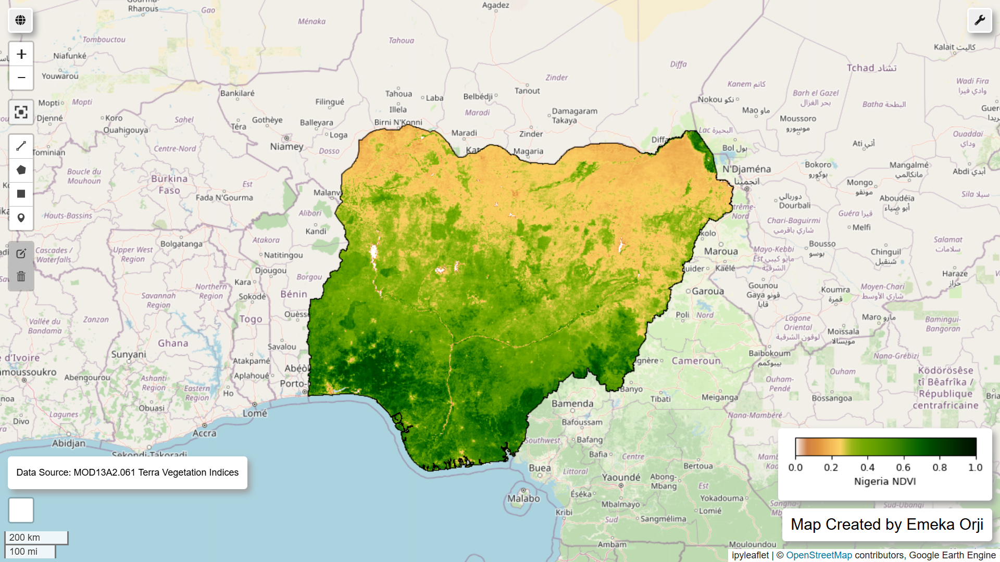

In [3]:
from IPython.display import Image, display
display(Image(filename='img/ngn_ndvi.png', embed=True))

In [4]:
# Function to aggregate all images taken for each month of 2023 to 1 image per month, using any summary statistics
# Here am taking monthly mean NDVI to convert the MODIS NDVI 23 images to 12 images (we looking at 1 Year 2023-2024, one image a month)

time_start = '2023'
time_end = '2024'


def temp_col(collection, start, count, interval, unit):
    seq = ee.List.sequence(0, ee.Number(count).subtract(1))
    origin_date = ee.Date(start)

    def func_eeg(i):
        start_date = origin_date.advance(ee.Number(interval).multiply(i), unit)
        end_date = origin_date.advance(ee.Number(interval).multiply(ee.Number(i).add(1)), unit)
        return collection.filterDate(start_date, end_date).mean().set('system:time_start', start_date.millis()).set('system:time_end', end_date.millis())

    return ee.ImageCollection(seq.map(func_eeg))

In [5]:
# Applying the function to modis ndvi image of nigeria

ng_veg_monthly = temp_col(ngveg, time_start, 12, 1, 'month')
ng_veg_monthly.first()

In [6]:
# Converting the images of the different months to a dataframe to perform exploratory analysis and charts.
fc = geemap.zonal_stats(
    ng_veg_monthly, ng, out_file_path=None, statistics_type='MEAN', scale=1000, return_fc=True
)

ng_veg = geemap.ee_to_df(fc)

Computing statistics ...


In [7]:
ng_veg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   0_NDVI      1 non-null      float64
 1   10_NDVI     1 non-null      float64
 2   11_NDVI     1 non-null      float64
 3   1_NDVI      1 non-null      float64
 4   2_NDVI      1 non-null      float64
 5   3_NDVI      1 non-null      float64
 6   4_NDVI      1 non-null      float64
 7   5_NDVI      1 non-null      float64
 8   6_NDVI      1 non-null      float64
 9   7_NDVI      1 non-null      float64
 10  8_NDVI      1 non-null      float64
 11  9_NDVI      1 non-null      float64
 12  ADM0_CODE   1 non-null      int64  
 13  ADM0_NAME   1 non-null      object 
 14  DISP_AREA   1 non-null      object 
 15  EXP0_YEAR   1 non-null      int64  
 16  STATUS      1 non-null      object 
 17  STR0_YEAR   1 non-null      int64  
 18  Shape_Area  1 non-null      float64
 19  Shape_Leng  1 non-null      float

In [8]:
ng_veg.head()

,0_NDVI,10_NDVI,11_NDVI,1_NDVI,2_NDVI,3_NDVI,4_NDVI,5_NDVI,6_NDVI,7_NDVI,8_NDVI,9_NDVI,ADM0_CODE,ADM0_NAME,DISP_AREA,EXP0_YEAR,STATUS,STR0_YEAR,Shape_Area,Shape_Leng
0,0.335162,0.478907,0.404152,0.304373,0.34364,0.365696,0.407824,0.458871,0.441659,0.508133,0.564232,0.554876,182,Nigeria,NO,3000,Member State,1000,74.92459,68.220375


In [9]:
nig = ng_veg.drop(labels=['ADM0_CODE', 'ADM0_NAME', 'DISP_AREA', 'EXP0_YEAR', 'STATUS', 'STR0_YEAR', 'Shape_Area', 'Shape_Leng'], axis =1)

ng_veg = nig.rename(columns={'0_NDVI': 'January', '1_NDVI': 'February', '2_NDVI': 'March', '3_NDVI': 'April', '4_NDVI': 'May', '5_NDVI': 'June',
                                '6_NDVI': 'July', '7_NDVI': 'August','10_NDVI': 'November', '11_NDVI': 'December', '8_NDVI': 'September', 
                                '9_NDVI': 'October'})

ng_veg = ng_veg[['January', 'February',	'March',	'April',	'May',	'June',	'July',	'August', 'September', 'October', 'November',	'December']]
ng_veg.head()

,January,February,March,April,May,June,July,August,September,October,November,December
0,0.335162,0.304373,0.34364,0.365696,0.407824,0.458871,0.441659,0.508133,0.564232,0.554876,0.478907,0.404152


In [10]:
ndving = ng_veg.transpose()
ndving['Date'] = ndving.index
ndving = ndving.rename(columns={0:'mean_ndvi'})
ndving.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12 entries, January to December
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   mean_ndvi  12 non-null     float64
 1   Date       12 non-null     object 
dtypes: float64(1), object(1)
memory usage: 588.0+ bytes


In [11]:
ndving.tail()

,mean_ndvi,Date
August,0.508133,August
September,0.564232,September
October,0.554876,October
November,0.478907,November
December,0.404152,December


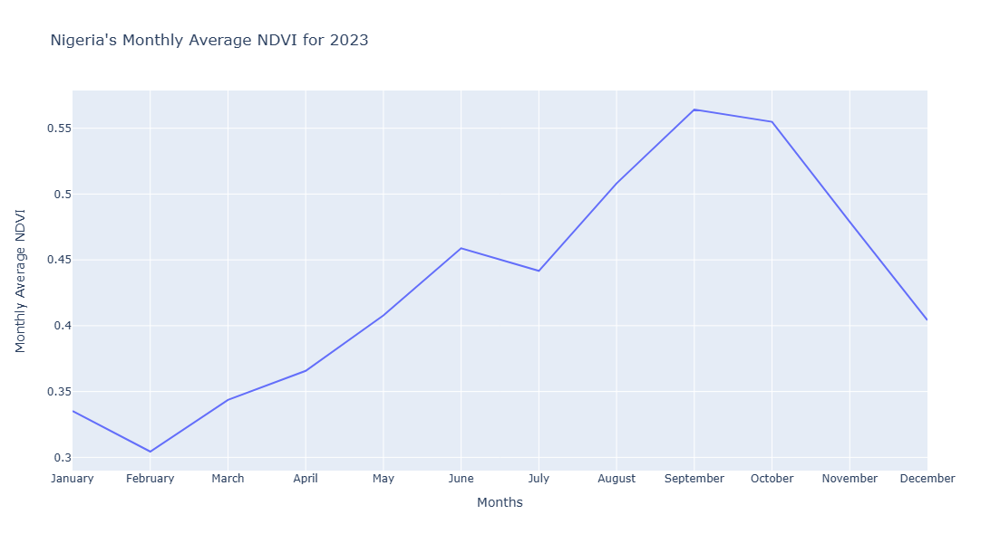

In [12]:
import pandas as pd
pd.options.plotting.backend = "plotly"
ndving.plot(x='Date', y='mean_ndvi', height=600,
             labels={'Date': 'Months', 'mean_ndvi':'Monthly Average NDVI'},title="Nigeria's Monthly Average NDVI for 2023")

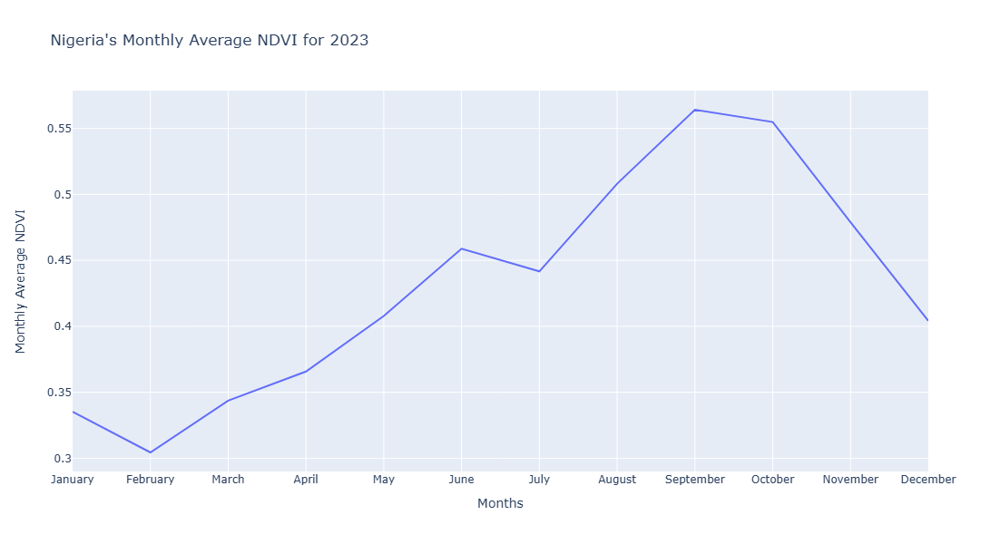

In [13]:
display(Image(filename='img/avg_ndvi_line.png', embed=True))

#### Calculating Nigeria Vegetation Condition index for 2023 using using the function ((ndvi - minimum_ndvi) / (maximum_ndvi - minimum_ndvi)) * 100

In [14]:
# Calculating VCI, multiplying by 100 produce a VCI with classes ranging from 0 to 100
min_ndvi = ngveg.reduce(ee.Reducer.min())
max_ndvi = ngveg.reduce(ee.Reducer.max())

def calvci(img):
    band = img.select('NDVI')
    vci = ((band.subtract(min_ndvi)).divide(max_ndvi.subtract(min_ndvi))).multiply(100).rename('VCI')
    return img.addBands(vci)

ngvci = ngveg.map(calvci).select('VCI')

In [15]:
# Extracting Mean Monthly (12 images, one per month) VCI from the 23 VCI images for 2023

ng_vci_monthly = temp_col(ngvci, time_start, 12, 1, 'month')

In [16]:
# Visualizing the Monthly Drought Condition of Nigeria for 2023 using the Monthly Mean Vegetation Condition Index (VCI)
map = geemap.Map()


vciVis = {
  'min': 0,
  'max': 100,
  'palette': ['#a50026', '#d73027', '#f46d43', '#fdae61', '#fee08b', 
              '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850', '#006837'
             ],
}

# map.addLayer(ng_vci_median, {'min':0, 'max':100, 'palette':['#a50026', '#d73027', '#f46d43', '#fdae61', '#fee08b', '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850', 
#                                                   '#006837']}, 'NigeriaDrought')


map.addLayer(ng_vci_monthly, vciVis, 'NigeriaDrought')
map.addLayer(ng.style(**vis_params), {}, 'Nigeria')

drought_class = """
Value	Color	Description
1	#a50026	Extreme Drought
2	#d73027	Severe Drought
3	#f46d43	Moderate Drought
4	#fdae61	Mild Drought
5	#fee08b	No Drought
6	#d9ef8b	No Drought
7	#a6d96a	Mild Wet
8	#66bd63	Wet
9	#1a9850	Severe Wet
10	#006837	Extreme Wet
"""

legend_dict = geemap.legend_from_ee(drought_class)



text = 'Map Created by Emeka Orji'
text2 = 'Data Source: MOD13A2.061 Terra Vegetation Indices'
map.add_text(text2, position='bottomleft', fontsize=12)
map.add_text(text)
#map.add_colorbar(vciVis, label='Nigeria Drought Condition', layer_name='NigeriaVCI')
map.add_legend(title="Nigeria Drought Condition", legend_dict=legend_dict)
map.center_object(ng, zoom=6)
map

Map(center=[9.589444610453368, 8.089338153274143], controls=(WidgetControl(options=['position', 'transparent_b…

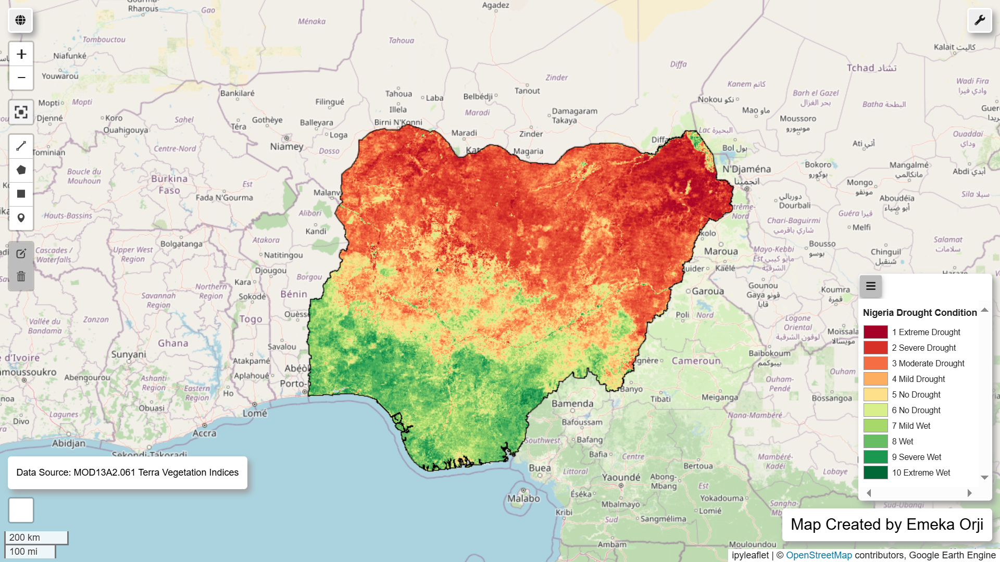

In [17]:
display(Image(filename='img/ngn_vci.png', embed=True))

In [18]:
# Converting the image to a Dataframe for Exploratory data analysis of the VIC image
fc = geemap.zonal_stats(
    ng_vci_monthly, ng, out_file_path=None, statistics_type='MEAN', scale=1000, return_fc=True
)

vci = geemap.ee_to_df(fc)

Computing statistics ...


In [19]:
vci.head()

,0_VCI,10_VCI,11_VCI,1_VCI,2_VCI,3_VCI,4_VCI,5_VCI,6_VCI,7_VCI,8_VCI,9_VCI,ADM0_CODE,ADM0_NAME,DISP_AREA,EXP0_YEAR,STATUS,STR0_YEAR,Shape_Area,Shape_Leng
0,26.96032,54.253443,39.014663,21.029208,26.913111,30.693657,38.787085,52.05372,54.690079,69.357435,76.768847,72.245871,182,Nigeria,NO,3000,Member State,1000,74.92459,68.220375


In [20]:
nig_vci = vci.drop(labels=['ADM0_CODE', 'ADM0_NAME', 'DISP_AREA', 'EXP0_YEAR', 'STATUS', 'STR0_YEAR', 'Shape_Area', 'Shape_Leng'], axis =1)

ngnvci = nig_vci.rename(columns={'0_VCI': 'January', '1_VCI': 'February', '2_VCI': 'March', '3_VCI': 'April', '4_VCI': 'May', '5_VCI': 'June',
                                '6_VCI': 'July', '7_VCI': 'August','10_VCI': 'November', '11_VCI': 'December', '8_VCI': 'September', 
                                '9_VCI': 'October'})

ngnvci = ngnvci[['January', 'February',	'March',	'April',	'May',	'June',	'July',	'August', 'September', 'October', 'November',	'December']]
ngnvci.head()

,January,February,March,April,May,June,July,August,September,October,November,December
0,26.96032,21.029208,26.913111,30.693657,38.787085,52.05372,54.690079,69.357435,76.768847,72.245871,54.253443,39.014663


In [21]:
ngn_vci = ngnvci.transpose()
ngn_vci['Date'] = ngn_vci.index
ngn_vci = ngn_vci.rename(columns={0:'VCI'})
ngn_vci.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12 entries, January to December
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   VCI     12 non-null     float64
 1   Date    12 non-null     object 
dtypes: float64(1), object(1)
memory usage: 588.0+ bytes


In [22]:
ngn_vci.tail()

,VCI,Date
August,69.357435,August
September,76.768847,September
October,72.245871,October
November,54.253443,November
December,39.014663,December


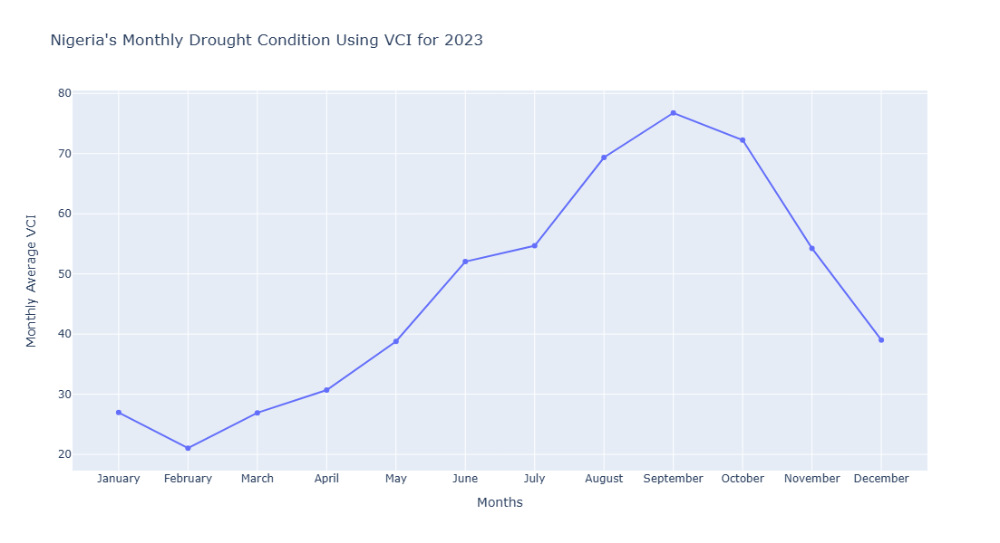

In [23]:
ngn_vci.plot(x='Date', y='VCI', height=600, markers=True,
             labels={'Date': 'Months', 'VCI':'Monthly Average VCI'},title="Nigeria's Monthly Drought Condition Using VCI for 2023")

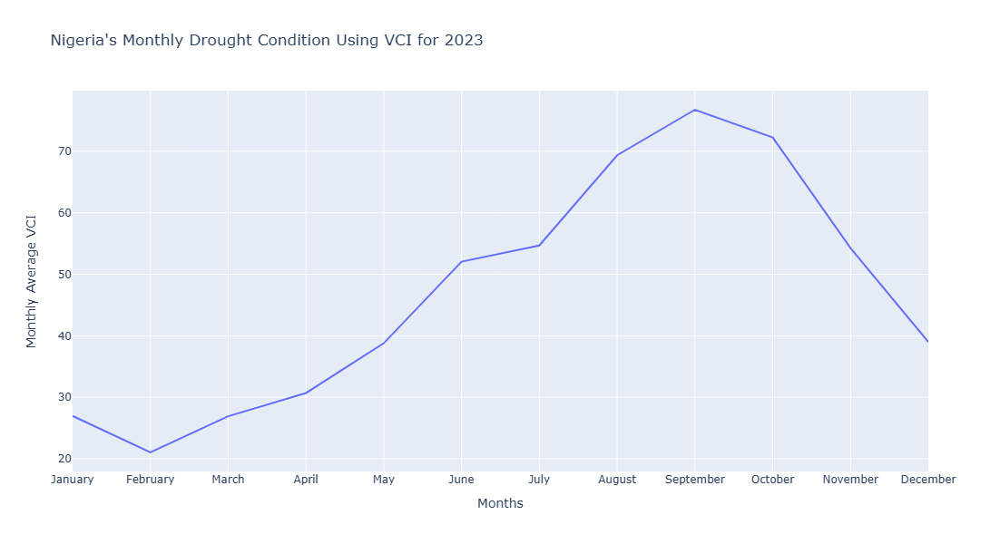

In [24]:
display(Image(filename='img/ngn_vci_line.png', embed=True))

##### Comparing monthly trend VCI and NDVI ranges

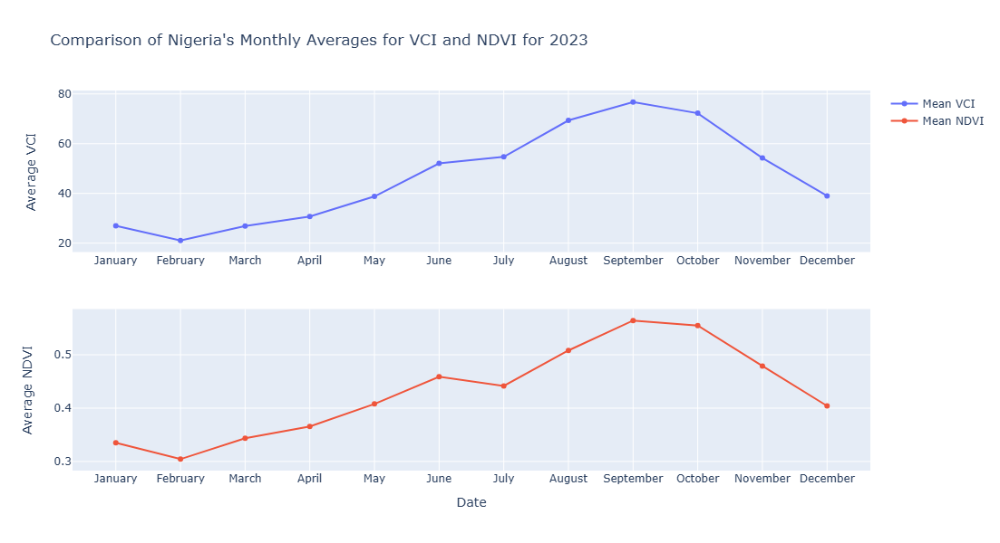

In [25]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=1)

fig.append_trace(go.Line(
    x=ngn_vci['Date'],
    y=ngn_vci['VCI'],
    name='Mean VCI',
), row=1, col=1)

fig.append_trace(go.Line(
    x=ndving['Date'],
    y=ndving['mean_ndvi'],
    name="Mean NDVI",
), row=2, col=1)


fig.update_layout(
    yaxis=dict(
        title="Average VCI",
        overlaying="y",
        side="bottom",
    ),
    yaxis2=dict(
        title="Average NDVI",
        overlaying="y",
        side="bottom",
    ),
    
    xaxis2=dict(
        title="Date",
        overlaying="y",
        side="bottom",
    )
)


fig.update_layout(height=600, width=1000, title_text="Comparison of Nigeria's Monthly Averages for VCI and NDVI for 2023")
fig.show()

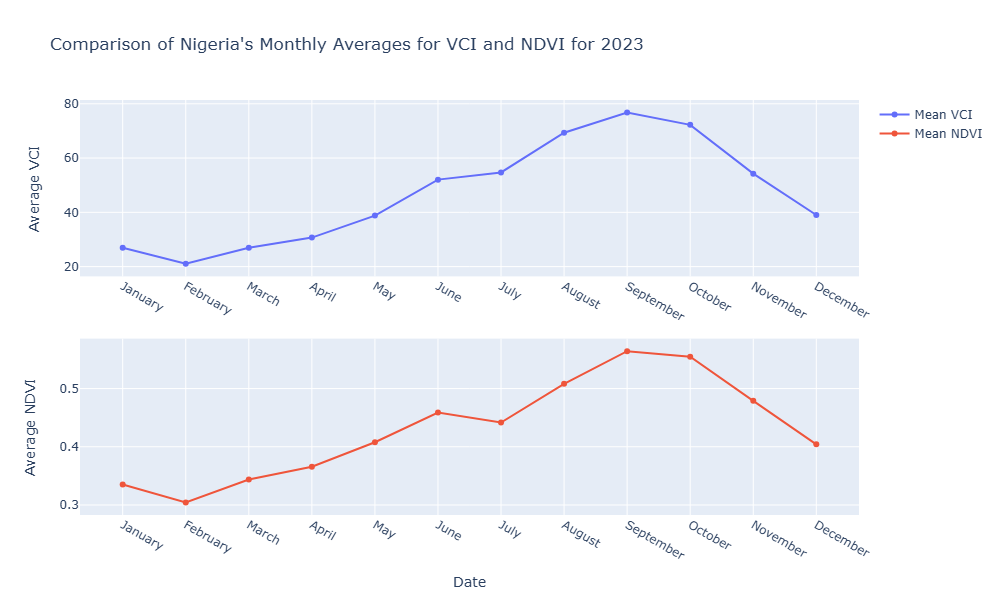

In [26]:
display(Image(filename='img/vci_ndvi_line.png', embed=True))

In [27]:
# assigning a new ndvi column to vci and multiplying by ndvi values by 100 to normalise the ndvi to vci values for ploting on same chart
ngn_vci['NDVI'] = ndving['mean_ndvi']
ngn_vci['NDVI'] *= 100
ngn_vci

,VCI,Date,NDVI
January,26.960320,January,33.516224
February,21.029208,February,30.437263
March,26.913111,March,34.363951
April,30.693657,April,36.569604
May,38.787085,May,40.782416
June,52.053720,June,45.887132
July,54.690079,July,44.165870
August,69.357435,August,50.813345
September,76.768847,September,56.423199
October,72.245871,October,55.487550


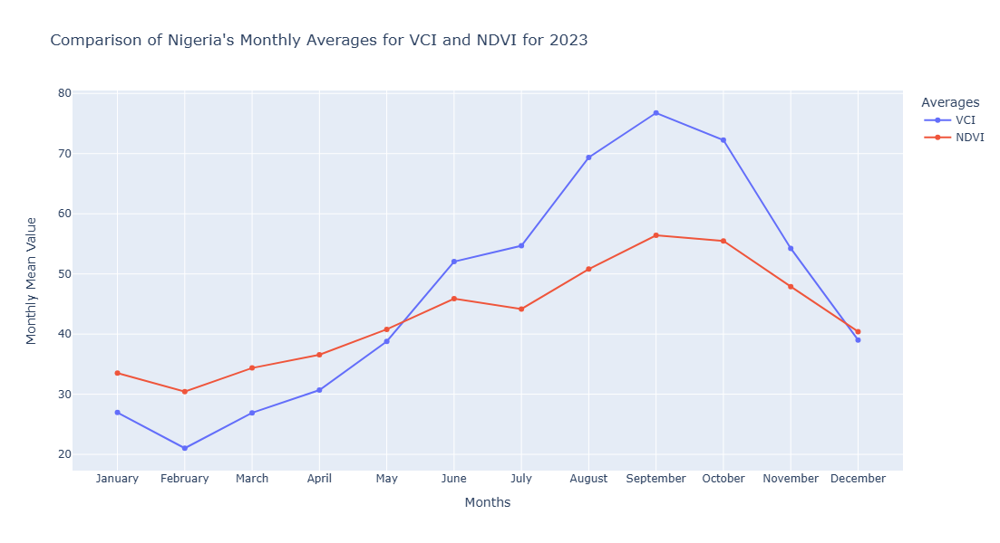

In [28]:
fig = ngn_vci.plot(x='Date', y=['VCI','NDVI'], height=600, markers=True,
             labels={'Date': 'Months', 'value':'Monthly Mean Value'},title="Comparison of Nigeria's Monthly Averages for VCI and NDVI for 2023")

# changing title of the legend 

fig.update_layout(legend_title_text='Averages',)

fig.show()

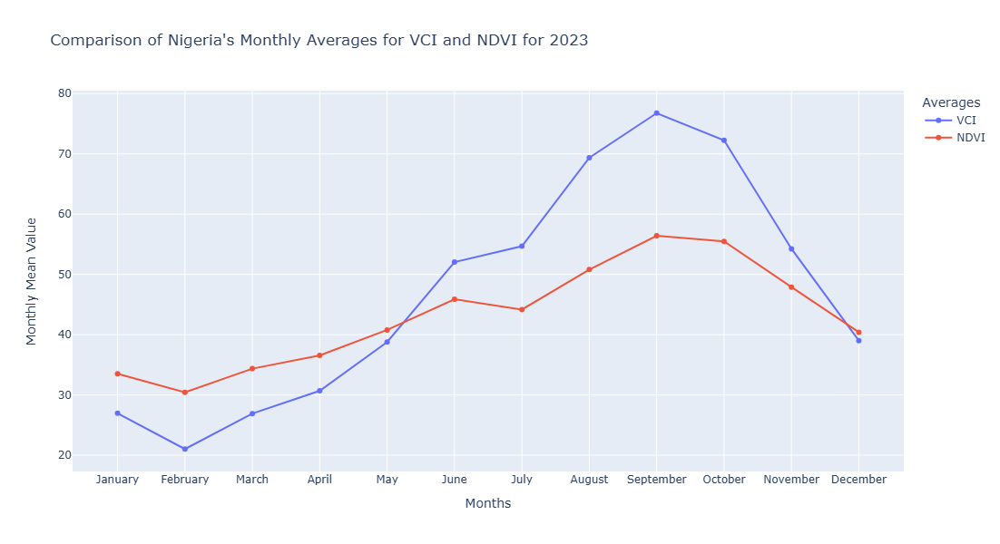

In [29]:
display(Image(filename='img/vci_ndvi.png', embed=True))

#### Calculating Amount Land Area with Specific Vegetation Condition (Drought Condition)

In [30]:
# Function to Reclassify the VCI images from from 100 classes (0 to 100) to 6 classes (1 to 6)
def cls(img):
    cons = ee.Image(0).where(img.lte(10), 1).where(img.gt(10).And(img.lte(20)), 2).where(img.gt(20).And(img.lte(40)), 3)\
    .where(img.gt(40).And(img.lte(60)), 4).where(img.gt(60).And(img.lte(80)), 5).where(img.gt(80).And(img.lte(100)), 6)
    return cons.copyProperties(img, ['system:time_start', 'system:time_end'])

In [31]:
ngn_ngvci = ngvci.map(cls)
ngn_ngvci.first()

In [32]:
# Taking the mode for all the images to aggregate to a single band
ngnci = ngn_ngvci.mode()
ngnci

In [33]:
# Visualizing the Drought Condition of Nigeria for 2023 using the 2023 Mean Vegetation Condition Index (VCI)
map = geemap.Map()

vvis = {
  'min': 1,
  'max': 6,
  'palette': ['darkred', 'orangered', 'orange', 'yellow', 'lightgreen', 'darkgreen'],
}

map.addLayer(ngnci.clip(ng), vvis, 'NigeriaVegetationDrought')
map.addLayer(ng.style(**vis_params), {}, 'Nigeria')

drought_class = """
Value	Color	Description
1	#8b0000	Extreme Dry
2	#ff4500	Severe Dry
3	#ffa500	Moderate Dry
4	#ffff00	Not Dry
5	#90ee90	Mild Wet
6	#234f1e	Very Wet
"""

legend_dict = geemap.legend_from_ee(drought_class)


text = 'Map Created by Emeka Orji'
text2 = 'Data Source: MOD13A2.061 Terra Vegetation Indices'
map.add_text(text2, position='bottomleft', fontsize=12)
map.add_text(text)
map.add_legend(title="Nigeria Drought Condition 2023", legend_dict=legend_dict)
map.center_object(ng, zoom=6)
map

Map(center=[9.589444610453368, 8.089338153274143], controls=(WidgetControl(options=['position', 'transparent_b…

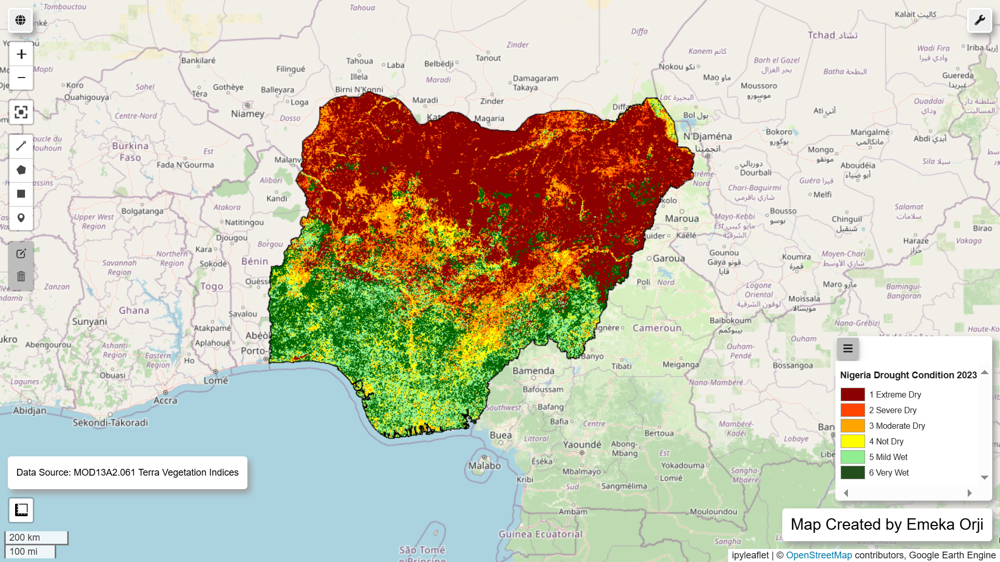

In [34]:
display(Image(filename='img/vci_class.png', embed=True))

In [35]:
projection = ngnci.projection().getInfo()
projection

{'type': 'Projection', 'crs': 'EPSG:4326', 'transform': [1, 0, 0, 0, 1, 0]}

In [36]:
crs = projection['crs']
crs_transform = projection['transform']

In [37]:
fc = geemap.zonal_stats_by_group(ngnci, ng, out_file_path=None, stat_type='Percentage', decimal_places=2, denominator=1e6, scale=1000, crs=crs, return_fc=True)

Computing ... 


In [38]:
ng_are_vci = geemap.ee_to_df(fc)

In [39]:
ng_are_vci.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ADM0_CODE   1 non-null      int64  
 1   ADM0_NAME   1 non-null      object 
 2   Class_0     1 non-null      float64
 3   Class_1     1 non-null      float64
 4   Class_2     1 non-null      float64
 5   Class_3     1 non-null      float64
 6   Class_4     1 non-null      float64
 7   Class_5     1 non-null      float64
 8   Class_6     1 non-null      float64
 9   Class_sum   1 non-null      float64
 10  DISP_AREA   1 non-null      object 
 11  EXP0_YEAR   1 non-null      int64  
 12  STATUS      1 non-null      object 
 13  STR0_YEAR   1 non-null      int64  
 14  Shape_Area  1 non-null      float64
 15  Shape_Leng  1 non-null      float64
dtypes: float64(10), int64(3), object(3)
memory usage: 260.0+ bytes


In [40]:
ng_are_vci.head()

,ADM0_CODE,ADM0_NAME,Class_0,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_sum,DISP_AREA,EXP0_YEAR,STATUS,STR0_YEAR,Shape_Area,Shape_Leng
0,182,Nigeria,0.002695,0.389354,0.065891,0.14238,0.067701,0.120746,0.211232,908963.28,NO,3000,Member State,1000,74.92459,68.220375


In [41]:
gng_vci = ng_are_vci.drop(['ADM0_CODE', 'ADM0_NAME', 'Class_sum', 'DISP_AREA', 'EXP0_YEAR', 'STATUS', 'STR0_YEAR', 'Shape_Area', 'Shape_Leng'], axis= 1)

In [42]:
ngr_vci = gng_vci.rename(columns={'Class_0':'Water body', 'Class_1':'Extreme Dry', 'Class_2':'Severe Dry', 'Class_3':'Moderate Dry',
                                  'Class_4':'Not Dry', 'Class_5':'Moderate Wet', 'Class_6':'Extreme Wet'})
ngr_vci = ngr_vci.transpose()
ngr_vci['Drought Type'] = ngr_vci.index
ngr_vci = ngr_vci.rename(columns={0:'area_cover'})
ngr_vci['area_cover'] *= 100
ngr_vci.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, Water body to Extreme Wet
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_cover    7 non-null      float64
 1   Drought Type  7 non-null      object 
dtypes: float64(1), object(1)
memory usage: 168.0+ bytes


In [43]:
ngr_vci.head(10)

,area_cover,Drought Type
Water body,0.269475,Water body
Extreme Dry,38.935442,Extreme Dry
Severe Dry,6.589114,Severe Dry
Moderate Dry,14.238003,Moderate Dry
Not Dry,6.770134,Not Dry
Moderate Wet,12.074613,Moderate Wet
Extreme Wet,21.123219,Extreme Wet


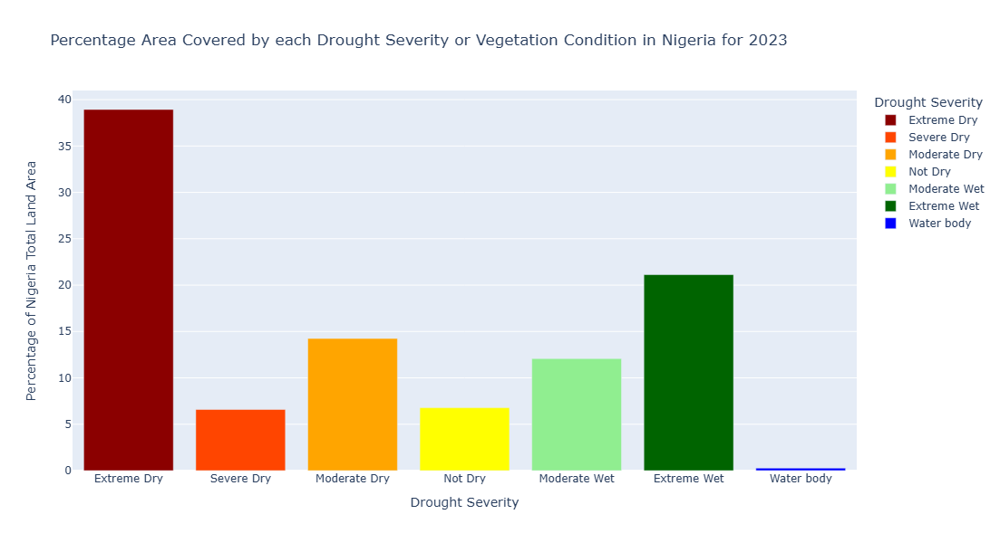

In [44]:
import plotly.express as px
import plotly.graph_objs as go

fig = px.bar(ngr_vci, x='Drought Type', y='area_cover', color='Drought Type',
             color_discrete_map={'Water body':'blue', 'Extreme Dry':'darkred', 'Severe Dry':'orangered', 'Moderate Dry':'orange', 'Not Dry':'yellow', 
                                 'Moderate Wet':'lightgreen', 'Extreme Wet':'darkgreen'},
             category_orders={'Drought Type':['Not Sure', 'Extreme Dry', 'Severe Dry', 'Moderate Dry', 'Not Dry', 'Moderate Wet', 'Extreme Wet']}, 
             height=600, labels={'Drought Type': 'Drought Severity', 'area_cover':'Percentage of Nigeria Total Land Area'}, 
             title="Percentage Area Covered by each Drought Severity or Vegetation Condition in Nigeria for 2023",)
fig.show()

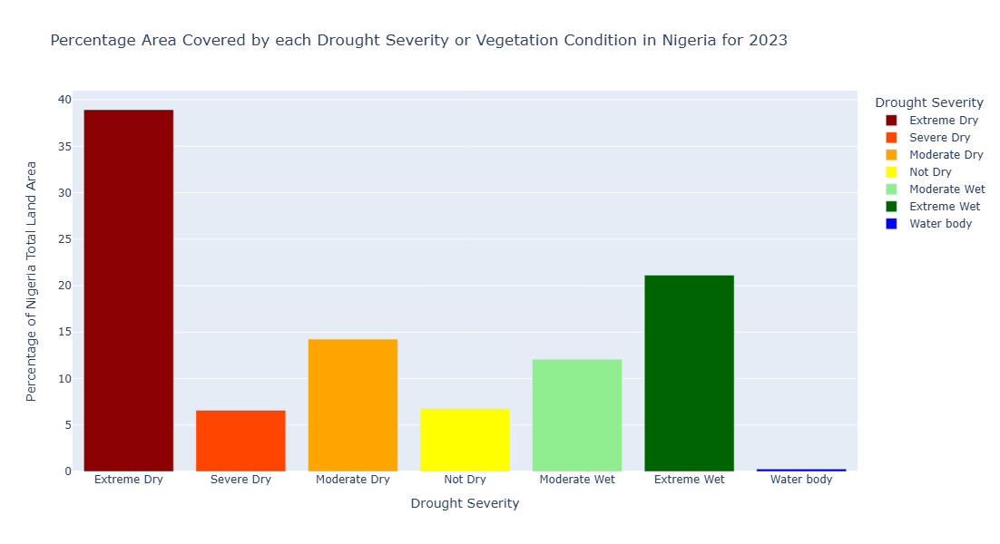

In [45]:
display(Image(filename='img/vci_severety.png', embed=True))

### Assessing Nigeria Vegetation Drought Condition by State

#### Calculating Nigeria's Normalized Difference Vegetation Index (NDVI) Using the MOD13A2.061 Terra Vegetation Indices 16-Day Global 1km

In [46]:
# importing MODIS dataset and filtering the date and selecting the ndvi band
data = ee.ImageCollection("MODIS/061/MOD13A2").filterDate('2023-01-01', '2024-01-01').select('NDVI')
nija = ee.FeatureCollection("FAO/GAUL/2015/level1").filter(ee.Filter.eq('ADM0_NAME', 'Nigeria'))
data.first()

In [47]:
#Applying scaling factor, which will allow us to use the original MODIS value of -1 to +1 for the visualization
#.copyProperties(image) , ['system:time_start', 'system:time_end']
ndviscale = data.map(lambda img: img.multiply(0.0001).copyProperties(img).copyProperties(img, ['system:time_start', 'system:time_end']))
ngndvi = ndviscale.map(lambda img: img.clipToCollection(nija))
ngndvi.size()

In [48]:
# converting ndvi to mean monthly ndvi
ng_ndvi_monthly = temp_col(ngndvi, time_start, 12, 1, 'month')
ng_ndvi_monthly.first()

In [49]:
#Visualizing monthly mean NDVI of Nigeria.. 0.0 means no Vegetation and the closer to 1 the more the vegetation
m = geemap.Map()
m.addLayer(ng_ndvi_monthly, ndviVis, 'NigeriaNDVI')
m.addLayer(nija.style(**vis_params), {}, 'Nigeria')
text = 'Map Created by Emeka Orji'
text2 = 'Data Source: MODIS/061/MOD13A2 Terra Vegetation'
m.add_text(text2, position='bottomleft', fontsize=10)
m.add_text(text)
m.add_colorbar(ndviVis, label='Nigeria NDVI', layer_name='NigeriaNDVI')
m.center_object(nija, zoom=6)
m

Map(center=[9.589444610453397, 8.089338153274129], controls=(WidgetControl(options=['position', 'transparent_b…

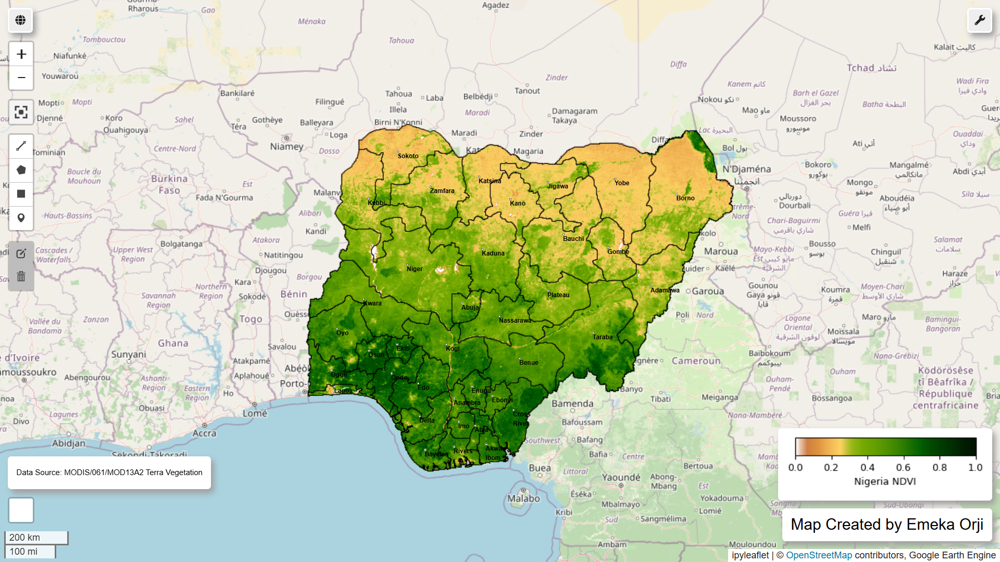

In [50]:
display(Image(filename='img/state_ndvi.png', embed=True))

In [51]:
m.add_labels(
    data=nija,
    column="ADM1_NAME",
    font_size="6pt",
    font_color="black",
    font_family="arial",
    font_weight="bold",
    draggable=True,
)

In [52]:
# Converting the ee image collection to Pandas Dataframe for exploratory data analysis using zonal statistics to get the mean ndvi for each state

fc = geemap.zonal_stats(
    ng_ndvi_monthly, nija, out_file_path=None, statistics_type='MEAN', scale=1000, return_fc=True
)

ng_ndvi = geemap.ee_to_df(fc)

Computing statistics ...


In [53]:
ng_ndvi.shape

(37, 22)

In [54]:
ng_ndvi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 22 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   0_NDVI      37 non-null     float64
 1   10_NDVI     37 non-null     float64
 2   11_NDVI     37 non-null     float64
 3   1_NDVI      37 non-null     float64
 4   2_NDVI      37 non-null     float64
 5   3_NDVI      37 non-null     float64
 6   4_NDVI      37 non-null     float64
 7   5_NDVI      37 non-null     float64
 8   6_NDVI      37 non-null     float64
 9   7_NDVI      37 non-null     float64
 10  8_NDVI      37 non-null     float64
 11  9_NDVI      37 non-null     float64
 12  ADM0_CODE   37 non-null     int64  
 13  ADM0_NAME   37 non-null     object 
 14  ADM1_CODE   37 non-null     int64  
 15  ADM1_NAME   37 non-null     object 
 16  DISP_AREA   37 non-null     object 
 17  EXP1_YEAR   37 non-null     int64  
 18  STATUS      37 non-null     object 
 19  STR1_YEAR   37 non-null     int

In [55]:
ng_ndvi.head(5)

,0_NDVI,10_NDVI,11_NDVI,1_NDVI,2_NDVI,3_NDVI,4_NDVI,5_NDVI,6_NDVI,7_NDVI,...,ADM0_CODE,ADM0_NAME,ADM1_CODE,ADM1_NAME,DISP_AREA,EXP1_YEAR,STATUS,STR1_YEAR,Shape_Area,Shape_Leng
0,0.541286,0.701792,0.608400,0.410085,0.593749,0.638407,0.541137,0.605553,0.403349,0.383773,...,182,Nigeria,65698,Abia,NO,3000,Member State,1997,0.385485,4.198984
1,0.266694,0.363754,0.299031,0.238705,0.232524,0.249756,0.279979,0.394091,0.508036,0.578794,...,182,Nigeria,65699,Bauchi,NO,3000,Member State,1997,4.055679,12.903322
2,0.549827,0.510536,0.588597,0.440650,0.524110,0.527651,0.519518,0.492353,0.315787,0.326943,...,182,Nigeria,65700,Bayelsa,NO,3000,Member State,1997,0.814464,8.485513
3,0.397572,0.607226,0.552351,0.352405,0.454602,0.478748,0.552015,0.564968,0.392554,0.394268,...,182,Nigeria,65701,Ebonyi,NO,3000,Member State,1997,0.505731,4.031511
4,0.520444,0.745282,0.670238,0.542958,0.648464,0.657974,0.688103,0.603114,0.382873,0.452707,...,182,Nigeria,65702,Ekiti,NO,3000,Member State,1997,0.429200,3.198663


In [56]:
print(list(ng_ndvi.columns.values))

['0_NDVI', '10_NDVI', '11_NDVI', '1_NDVI', '2_NDVI', '3_NDVI', '4_NDVI', '5_NDVI', '6_NDVI', '7_NDVI', '8_NDVI', '9_NDVI', 'ADM0_CODE', 'ADM0_NAME', 'ADM1_CODE', 'ADM1_NAME', 'DISP_AREA', 'EXP1_YEAR', 'STATUS', 'STR1_YEAR', 'Shape_Area', 'Shape_Leng']


In [57]:
# Dropping irrelevant columns and changing column names
ngNDvi = ng_ndvi.iloc[ : , 0:12]
ngNdvi = ngNDvi.copy()
ngNdvi['avg_ndvi_23'] = ngNdvi.mean(axis=1)

ngNdvi['States'] = ng_ndvi['ADM1_NAME']
ngNdvi = ngNdvi.rename(columns={'0_NDVI': 'January', '1_NDVI': 'February', '2_NDVI': 'March', '3_NDVI': 'April', '4_NDVI': 'May', '5_NDVI': 'June',
                                '6_NDVI': 'July', '7_NDVI': 'August','10_NDVI': 'November', '11_NDVI': 'December', '8_NDVI': 'September', 
                                '9_NDVI': 'October'})
#ngNdvi['avg_ndvi_23'] = ngNdvi.iloc[:, 0:12].mean(axis=1)
ngNdvi = ngNdvi[['January', 'February',	'March',	'April',	'May',	'June',	'July',	'August', 'September', 'October', 'November',	'December',	'avg_ndvi_23', 'States']]
ngNdvi.sort_values('avg_ndvi_23', ascending=False).head(10)

,January,February,March,April,May,June,July,August,September,October,November,December,avg_ndvi_23,States
4,0.520444,0.542958,0.648464,0.657974,0.688103,0.603114,0.382873,0.452707,0.640848,0.710298,0.745282,0.670238,0.605275,Ekiti
8,0.547708,0.546788,0.640776,0.645725,0.614121,0.533648,0.330465,0.303004,0.546722,0.696065,0.716381,0.669659,0.565922,Ondo
21,0.498271,0.494000,0.620674,0.576213,0.635096,0.544869,0.370173,0.332583,0.607669,0.623784,0.716414,0.629595,0.554112,Edo
33,0.553564,0.551415,0.599513,0.610375,0.598439,0.535229,0.251685,0.293301,0.524929,0.686593,0.695048,0.675621,0.547976,Osun
32,0.489415,0.421326,0.599495,0.655599,0.616570,0.610395,0.353903,0.325454,0.522314,0.661929,0.661112,0.636338,0.546154,Ogun
28,0.411566,0.408200,0.483929,0.526726,0.637719,0.581143,0.494429,0.535041,0.629877,0.620375,0.646268,0.556346,0.544302,Kogi
5,0.436647,0.436725,0.543549,0.588040,0.608773,0.657837,0.451633,0.452026,0.555834,0.456698,0.654912,0.589681,0.536030,Enugu
0,0.541286,0.410085,0.593749,0.638407,0.541137,0.605553,0.403349,0.383773,0.520663,0.352115,0.701792,0.608400,0.525026,Abia
35,0.363523,0.321298,0.381399,0.466776,0.563838,0.587241,0.565020,0.559176,0.628898,0.675503,0.604934,0.484525,0.516844,Taraba
19,0.568356,0.475068,0.615068,0.607100,0.589974,0.486356,0.275455,0.328688,0.475155,0.495522,0.571186,0.651647,0.511631,Cross River


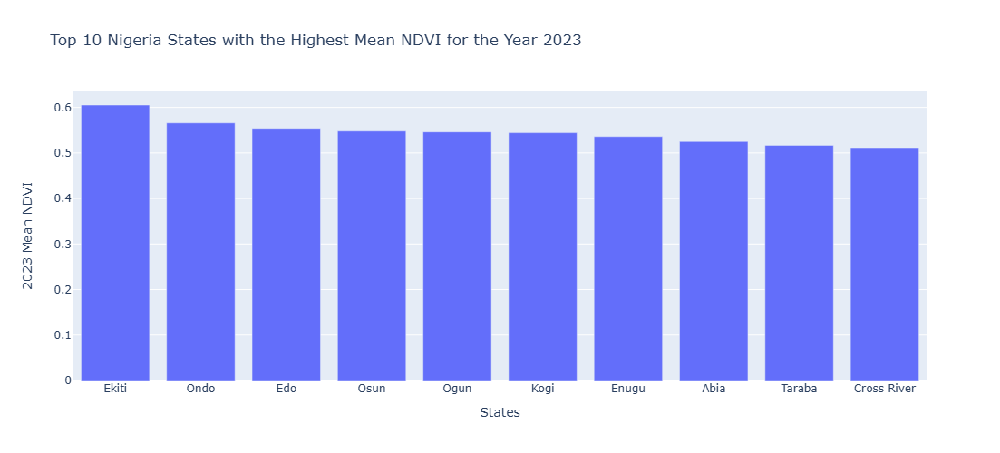

In [58]:
geemap.bar_chart(ngNdvi, x='States', y='avg_ndvi_23', descending=True, sort_column= 'avg_ndvi_23', max_rows=10,
                 x_label='States', y_label='2023 Mean NDVI', title='Top 10 Nigeria States with the Highest Mean NDVI for the Year 2023')

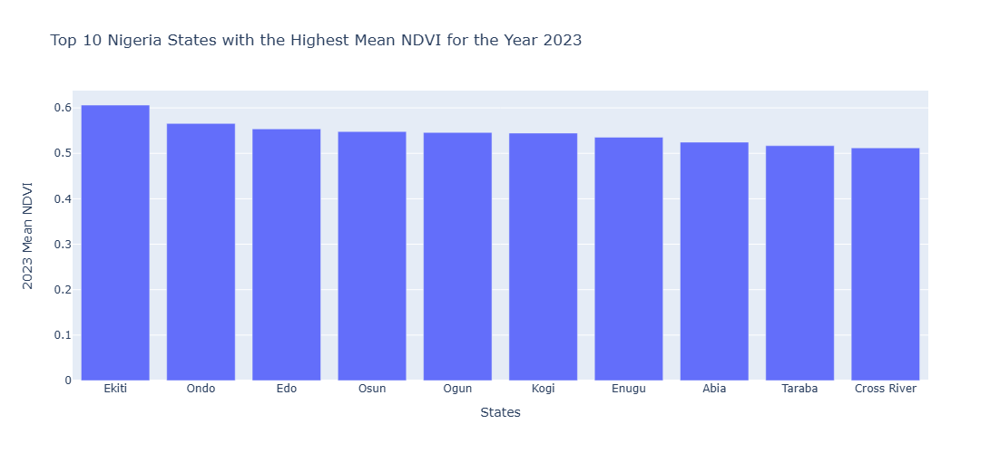

In [59]:
display(Image(filename='img/state_ndvi_bar.png', embed=True))

In [60]:
ngNdvi.sort_values('avg_ndvi_23', ascending=False).tail(10)

,January,February,March,April,May,June,July,August,September,October,November,December,avg_ndvi_23,States
12,0.264437,0.246509,0.247197,0.246312,0.268006,0.391846,0.491623,0.601406,0.644354,0.542600,0.382879,0.296929,0.385342,Zamfara
1,0.266694,0.238705,0.232524,0.249756,0.279979,0.394091,0.508036,0.578794,0.551119,0.502258,0.363754,0.299031,0.372062,Bauchi
18,0.292270,0.264287,0.259366,0.250945,0.276246,0.450688,0.508356,0.564205,0.503373,0.430545,0.320772,0.277560,0.366551,Borno
6,0.258074,0.233278,0.222549,0.225589,0.241685,0.326831,0.443122,0.510305,0.522159,0.515555,0.379467,0.287295,0.347159,Gombe
25,0.233647,0.212980,0.210773,0.208953,0.221346,0.315647,0.497865,0.602451,0.565380,0.471538,0.321784,0.257944,0.343359,Kano
27,0.261914,0.232914,0.236968,0.232356,0.242117,0.324693,0.395758,0.489722,0.529847,0.470994,0.356811,0.291206,0.338775,Kebbi
26,0.232810,0.213172,0.207121,0.199970,0.207790,0.304465,0.499230,0.591067,0.555506,0.455141,0.320170,0.258944,0.337115,Katsina
23,0.249280,0.229801,0.220447,0.209673,0.215602,0.282685,0.431192,0.498604,0.482148,0.422166,0.323229,0.272382,0.319767,Jigawa
11,0.246927,0.228131,0.216811,0.209706,0.209178,0.260494,0.389538,0.495237,0.468005,0.377266,0.300293,0.257577,0.304930,Sokoto
36,0.239058,0.216756,0.209060,0.202250,0.203439,0.285505,0.355406,0.458858,0.418366,0.359689,0.280012,0.236816,0.288768,Yobe


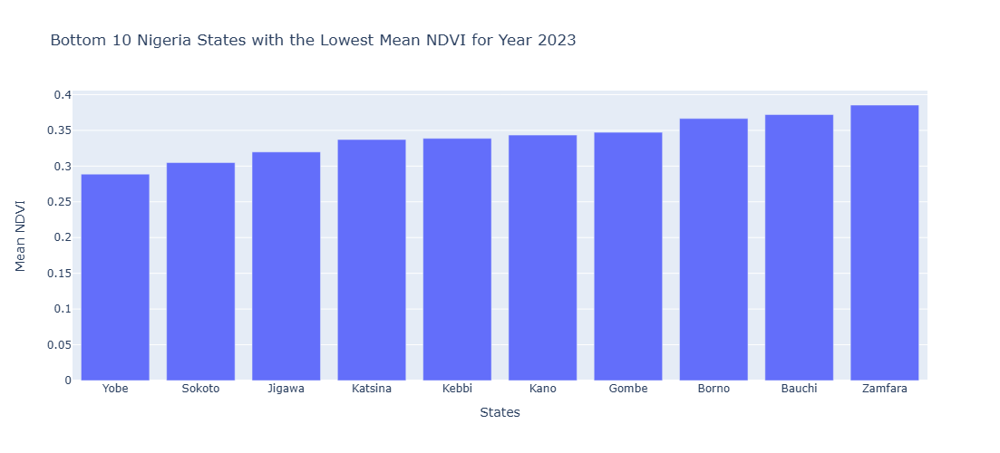

In [61]:
geemap.bar_chart(ngNdvi, x='States', y='avg_ndvi_23', descending=False, sort_column= 'avg_ndvi_23', max_rows=10,
                 x_label='States', y_label='Mean NDVI', title='Bottom 10 Nigeria States with the Lowest Mean NDVI for Year 2023')

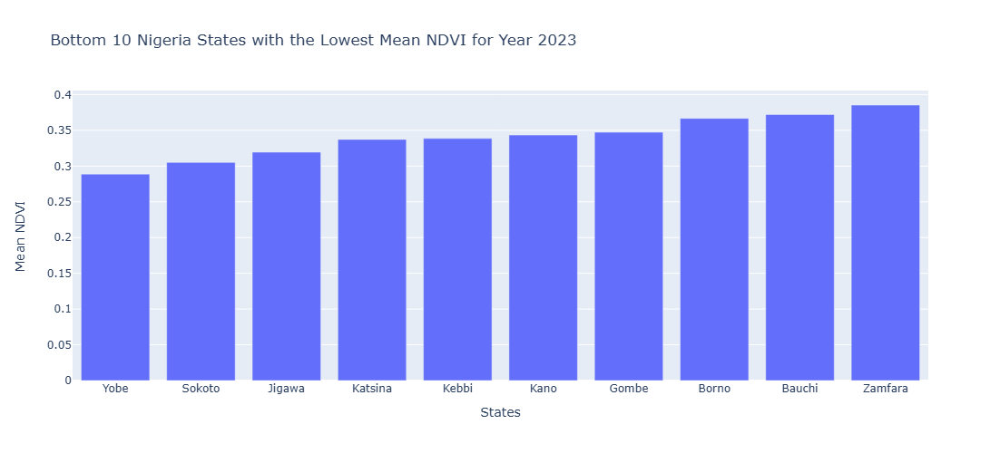

In [62]:
display(Image(filename='img/state_ndvi_bar2.png', embed=True))

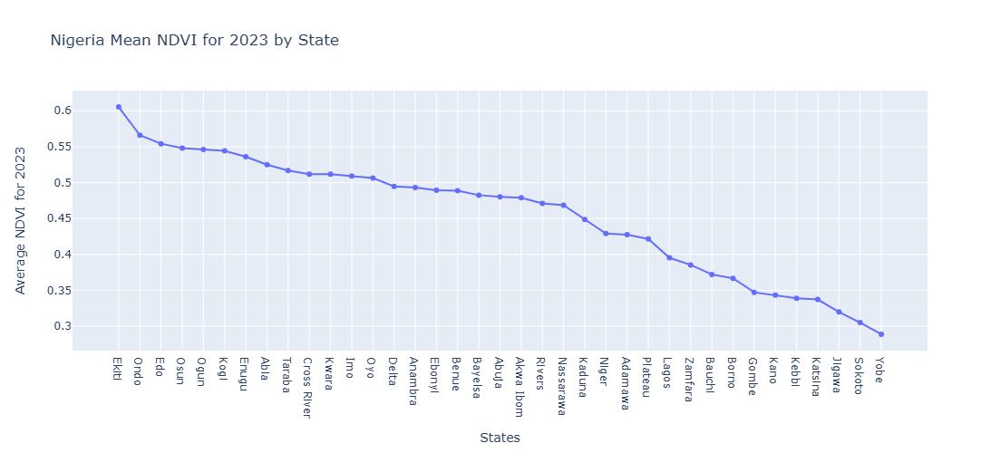

In [63]:
geemap.plot.line_chart(ngNdvi, x='States', y='avg_ndvi_23', x_label='States', y_label='Average NDVI for 2023', markers=True,
                       title='Nigeria Mean NDVI for 2023 by State', descending=True, )

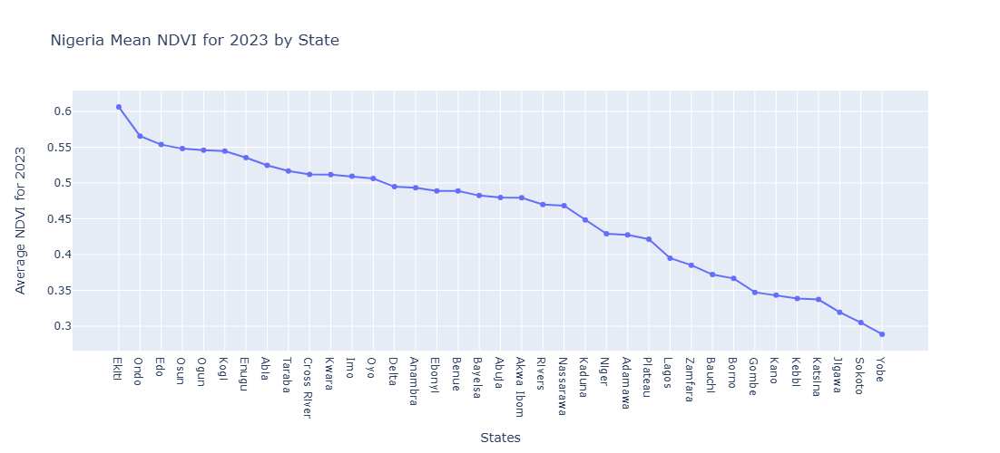

In [64]:
display(Image(filename='img/state_ndvi_line.png', embed=True))

In [65]:
n = ngNdvi.drop(['avg_ndvi_23'], axis =1)
ngn_ndvi = n.set_index('States').transpose()
ngn_ndvi['Months'] = ngn_ndvi.index
ngn_ndvi.tail(5)

States,Ekiti,Ondo,Edo,Osun,Ogun,Kogi,Enugu,Abia,Taraba,Cross River,...,Bauchi,Borno,Gombe,Kano,Kebbi,Katsina,Jigawa,Sokoto,Yobe,Months
August,0.452707,0.303004,0.332583,0.293301,0.325454,0.535041,0.452026,0.383773,0.559176,0.328688,...,0.578794,0.564205,0.510305,0.602451,0.489722,0.591067,0.498604,0.495237,0.458858,August
September,0.640848,0.546722,0.607669,0.524929,0.522314,0.629877,0.555834,0.520663,0.628898,0.475155,...,0.551119,0.503373,0.522159,0.565380,0.529847,0.555506,0.482148,0.468005,0.418366,September
October,0.710298,0.696065,0.623784,0.686593,0.661929,0.620375,0.456698,0.352115,0.675503,0.495522,...,0.502258,0.430545,0.515555,0.471538,0.470994,0.455141,0.422166,0.377266,0.359689,October
November,0.745282,0.716381,0.716414,0.695048,0.661112,0.646268,0.654912,0.701792,0.604934,0.571186,...,0.363754,0.320772,0.379467,0.321784,0.356811,0.320170,0.323229,0.300293,0.280012,November
December,0.670238,0.669659,0.629595,0.675621,0.636338,0.556346,0.589681,0.608400,0.484525,0.651647,...,0.299031,0.277560,0.287295,0.257944,0.291206,0.258944,0.272382,0.257577,0.236816,December


In [66]:
a = ngNdvi.sort_values('avg_ndvi_23', ascending=False)
b = a['States'].head(5).to_list()
print(b)

['Ekiti', 'Ondo', 'Edo', 'Osun', 'Ogun']


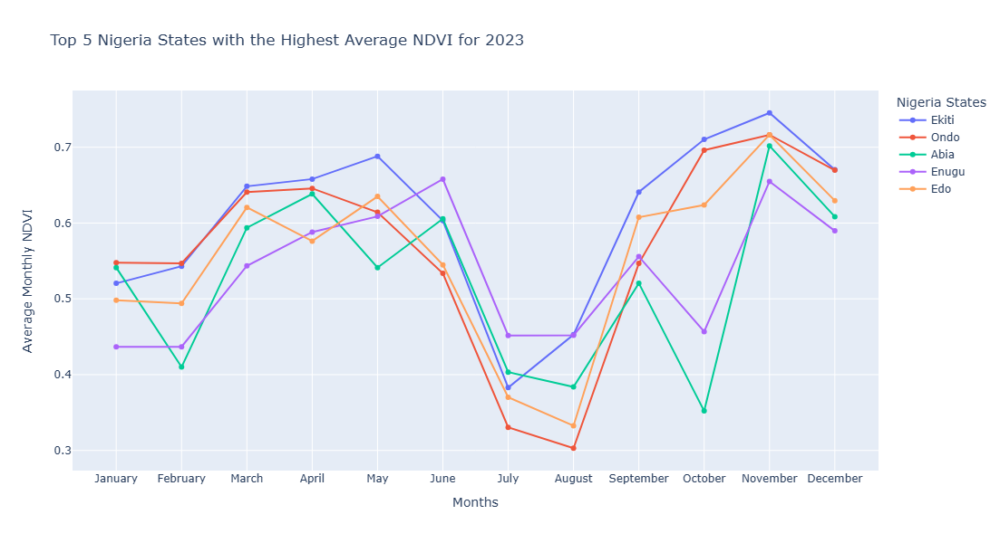

In [67]:
#pd.options.plotting.backend = "plotly"
# ngn_ndvi.plot(x='Months', y=['Ekiti', 'Ondo', 'Abia', 'Enugu', 'Edo'], height=600, markers=True,
#              labels={'Months': 'Month', 'value':'Monthly Average NDVI'},title='Top 5 Nigeria States with the Highest Average NDVI for 2023')



fig = px.line(ngn_ndvi, x='Months', y=['Ekiti', 'Ondo', 'Abia', 'Enugu', 'Edo'], markers=True,
             height=600, labels={'Drought Type': 'Drought Severity', 'area_cover':'Percentage of Nigeria Total Land Area'}, 
             title='Top 5 Nigeria States with the Highest Average NDVI for 2023')
fig.update_layout(
    title="Top 5 Nigeria States with the Highest Average NDVI for 2023",
    xaxis_title="Months",
    yaxis_title="Average Monthly NDVI",
    legend_title="Nigeria States",
)

fig.show()

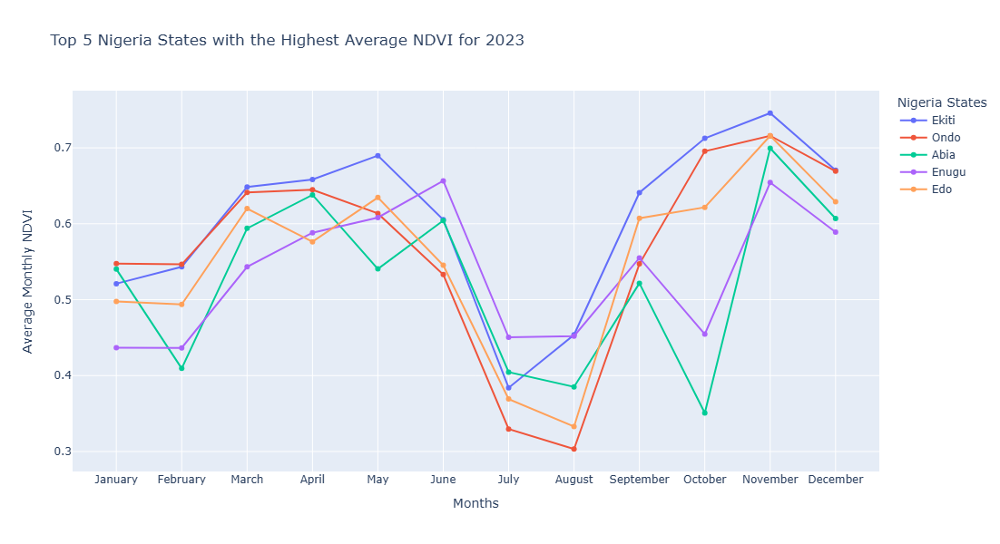

In [68]:
display(Image(filename='img/top_states.png', embed=True))

In [69]:
c = ngNdvi.sort_values('avg_ndvi_23', ascending=False)
d = c['States'].tail(5).to_list()
print(d)

['Kebbi', 'Katsina', 'Jigawa', 'Sokoto', 'Yobe']


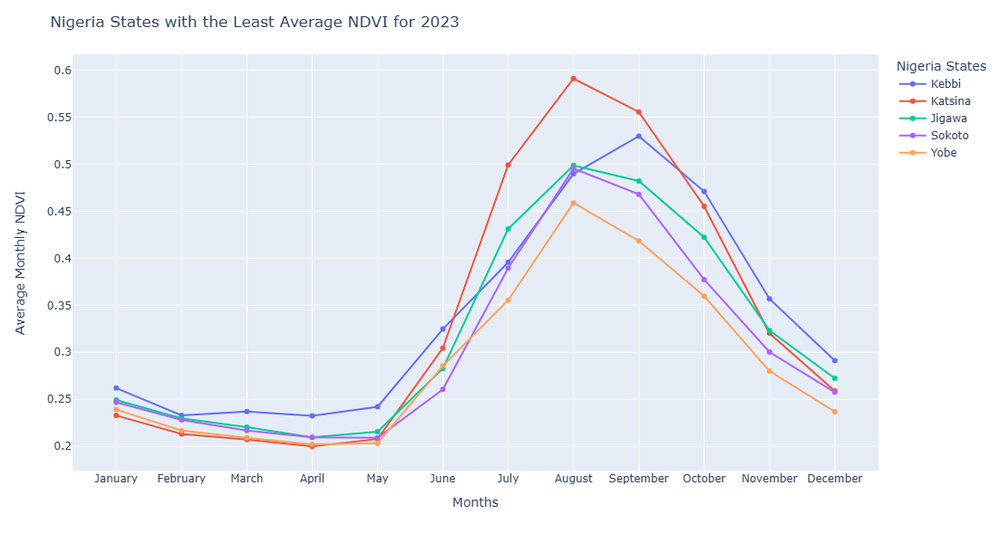

In [70]:
# ngn_ndvi.plot(x='Months', y=['Kebbi', 'Katsina', 'Jigawa', 'Sokoto', 'Yobe'], height=600,
#              labels={'Months': 'Month', 'value':'Monthly Average NDVI'},title='Nigeria States with the Least Average NDVI for 2023')


fig = px.line(ngn_ndvi, x='Months', y=['Kebbi', 'Katsina', 'Jigawa', 'Sokoto', 'Yobe'], markers=True,
             height=600, labels={'Drought Type': 'Drought Severity', 'area_cover':'Percentage of Nigeria Total Land Area'})
fig.update_layout(
    title="Nigeria States with the Least Average NDVI for 2023",
    xaxis_title="Months",
    yaxis_title="Average Monthly NDVI",
    legend_title="Nigeria States",
)

fig.show()

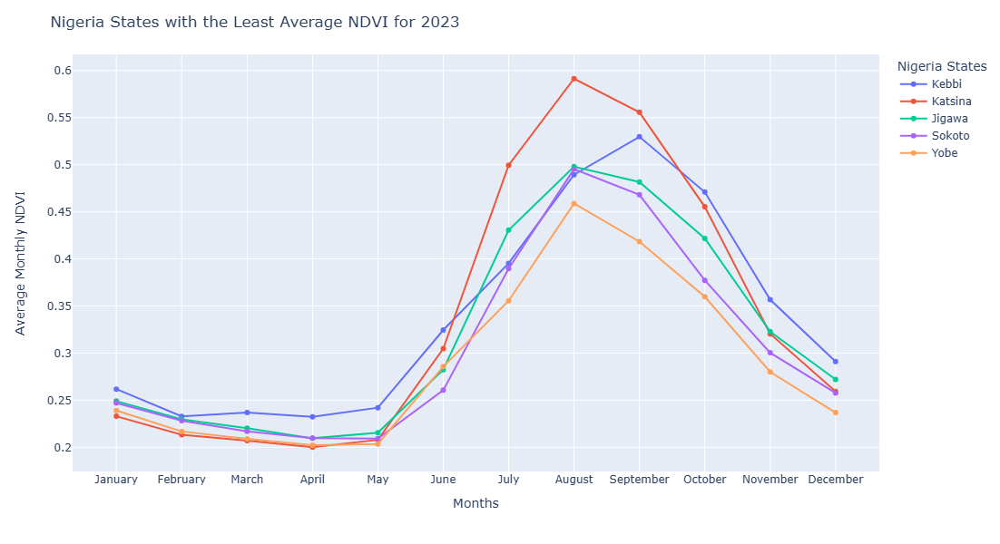

In [71]:
display(Image(filename='img/bottom_states.png', embed=True))

#### Calculating VCI (Vegetation Condition Index) for States in Nigeria using the MODIS NDVI Data
 VCI calculation from MODIS NDVI \
 VCI = (NDVI - NDVImin) / (NDVIMax - NDVImin) * 100  // VCI Formula

In [72]:
# Calculating VCI
# VCI calculation from MODIS NDVI
# VCI = (NDVI - NDVImin) / (NDVIMax - NDVImin) * 100 //VCI Formula

# I am multiplying with the scale factor of 0.0001 as indicated on the MODIS data description

ndvi = ee.ImageCollection("MODIS/061/MOD13A2").filterDate('2023-01-01', '2024-01-01').select('NDVI')
ndviMin = ndvi.reduce(ee.Reducer.min()).multiply(0.0001)
ndviMax = ndvi.reduce(ee.Reducer.max()).multiply(0.0001)


def CalVci(img):
    band = img.select('NDVI').multiply(0.0001)
    VCI = band.subtract(ndviMin).divide((ndviMax.subtract(ndviMin))).multiply(100).rename('VCI')
    return img.addBands(VCI)

ndtovci = ndvi.map(CalVci)

vci = ndtovci.select('VCI')

vci.first()

In [73]:
# Visualizing the Drought Condition of Nigeria for 2023 using the Median Vegetation Condition Index (VCI) for the Year 2023

ng_vci_median = vci.select('VCI').median().clipToCollection(nija)
#ngvci = vci.map(lambda img: img.clipToCollection(nija))

map = geemap.Map()

vciVis = {
  'min': 0,
  'max': 100,
  'palette': ['#a50026', '#d73027', '#f46d43', '#fdae61', '#fee08b', 
              '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850', '#006837'
             ],
}


map.addLayer(ng_vci_median, vciVis, 'NigeriaDrought')
map.addLayer(nija.style(**vis_params), {}, 'Nigeria')

drought_class = """
Value	Color	Description
1	#a50026	Extreme Drought
2	#d73027	Severe Drought
3	#f46d43	Moderate Drought
4	#fdae61	Mild Drought
5	#fee08b	Light Drought
6	#d9ef8b	No Drought
7	#a6d96a	No Drought
8	#66bd63	No Drought
9	#1a9850	No Drought
10	#006837	No Drought
"""

legend_dict = geemap.legend_from_ee(drought_class)

map.add_labels(
    data=nija,
    column="ADM1_NAME",
    font_size="5pt",
    font_color="black",
    font_family="arial",
    font_weight="bold",
    draggable=True,
)


text = 'Map Created by Emeka Orji'
text2 = 'Data Source: MODIS/061/MOD13A2 Terra Vegetation'
map.add_text(text2, position='bottomleft', fontsize=12)
map.add_text(text)
map.add_colorbar(vciVis, label='Nigeria Drought Condition', layer_name='NigeriaVCI')
map.add_legend(title="Nigeria Drought Condition", legend_dict=legend_dict)
map.center_object(nija, zoom=6)
map

Map(center=[9.589444610453397, 8.089338153274129], controls=(WidgetControl(options=['position', 'transparent_b…

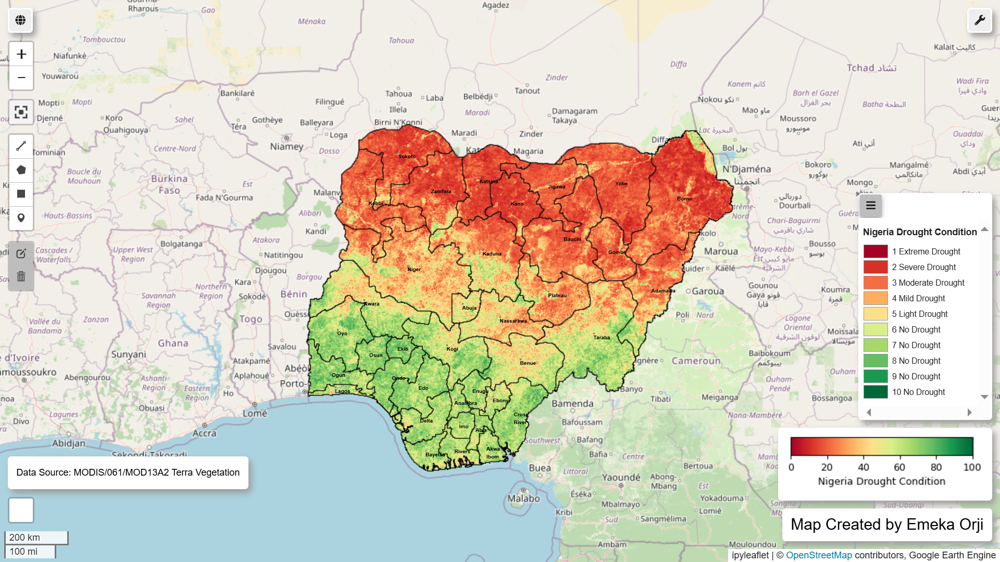

In [74]:
display(Image(filename='img/state_vci.png', embed=True))

In [75]:
fc = geemap.zonal_stats_by_group(ngnci, nija, out_file_path=None, stat_type='SUM', decimal_places=2, denominator=1e6, scale=1000, crs=crs, return_fc=True)

Computing ... 


In [76]:
ng_state_vci = geemap.ee_to_df(fc)